This goal of this notebook: (7/5/2023)
1. Structure my code in a modular fashion
2. Optimize the split-step method performance in CPU
3. Using GPU to perform the split-step

In [1]:
using BenchmarkTools, TimerOutputs
using CSV, DataFrames, JSON, JLD, OrderedCollections
using FFTW, GLM, LinearAlgebra, Random
using LaTeXStrings, ColorSchemes, Plots
using Profile, Base.Threads, ProgressMeter

In [2]:
push!(LOAD_PATH, "./src/");
using Revise
using CUDA
using FileIO
using Pulse, Modulation, NLOclass, NLO, SplitStep, SplitStepParallel, PlotPulse
using ECPOclass, ECPO

[ Info: Precompiling FileIO [top-level]
[ Info: Precompiling NLO [top-level]
[ Info: Precompiling SplitStep [top-level]
[ Info: Precompiling SplitStepParallel [top-level]
[ Info: Precompiling ECPOclass [top-level]
[ Info: Precompiling ECPO [top-level]


# Simple test cases and benchmarking
This is to simplify the initiation of the process

## Dispersion only in a two-field scenario
Note:
- I checked the correspondence between the analytical expressions for Fourier Components in both time and frequency domain. We see excellent agreement up to a certain propagation length, within which the wave distribution remains within the time window.
- The problem can be overcome by increasing Tmax (the time sampling window)

In [5]:
function pulse_disp(T, z, A, σ, β0, β1, β2)
    γp = exp(1im*β0*z)/sqrt(2*pi*(σ^2-1im*β2*z))
    fp = exp(-(T-β1*z)^2/(2*(σ^2-1im*β2*z)))
    return A * γp * fp
end;

function pulse_disp_FT(ω, z, A, σ, β0, β1, β2)
    out = A * exp(1im*z*(β0 - β1*ω + 0.5*β2*ω^2)) * exp(-(σ*ω)^2/2)
    return out
end;

In [118]:
# Just linear dispersion term
lin1 = pars_nl()

# Signal (1)/ Pump (2) in column 
lin1.βnl = [0.0     0.0    ;      
            0.0e-2  0.0e-2 ;
            2.5e-3  1.25e-3];
lin1.ωnl = [0.2 ; 0.4];
lin1.κnl = 0;

In [119]:
# Pulse properties
pulse1 = pars_pulse()
pulse1.amp_max = [1.0 ; 0.5];
pulse1.T_pulse = [0.2 ; 0.3];
pulse1.N_div = (2^10);
pulse1.f_pulse = Pulse.ff_gauss;

# The pulsed DOPA properties
disp1 = nl_pulse(lin1,pulse1; fac = 10);

FFTW.set_num_threads(1)
fft_dim = 1
p_fft1! = plan_fft!(disp1.init_amp, fft_dim);
p_ifft1! = plan_ifft!(disp1.init_amp, fft_dim);

In [120]:
# Analytic solution for gaussian pulse
Lz = 30.0;
analytic_pulse = zeros(ComplexF32, size(disp1.init_amp))
analytic_pulse_ft = zeros(ComplexF32, size(disp1.init_amp))
arr_omega = (2*pi) .* fftfreq(disp1.pulse.N_div) * (pulse1.N_div / (2*disp1.Tmax))

for i in 1:size(analytic_pulse)[2]
    analytic_pulse[:,i] .= pulse_disp.(disp1.arr_time, Lz, pulse1.amp_max[i], pulse1.T_pulse[i], lin1.βnl[:,i]...)
    analytic_pulse_ft[:,i] .= pulse_disp_FT.(arr_omega, Lz, pulse1.amp_max[i], pulse1.T_pulse[i], lin1.βnl[:,i]...)
end

In [121]:
# Numerical solution
split_step_nl!(Lz, disp1, op_nl_dopa!, dz = 0.1, step_method = rk4_step_nl!, p_fft = (p_fft1!, p_ifft1!))

In [122]:
amp_ft = zeros(ComplexF32, size(disp1.init_amp))
amp_ft[:,1] .= fft(disp1.out_amp[:,1]) .* (disp1.dT);
amp_ft[:,2] .= fft(disp1.out_amp[:,2]) .* (disp1.dT);

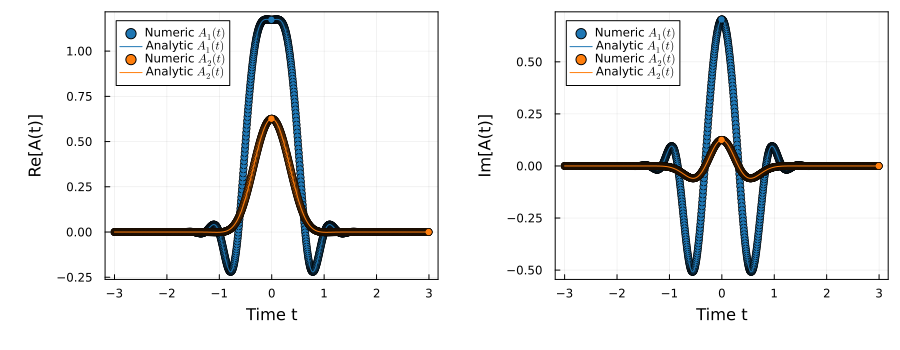

In [123]:
# Propagation in time domain
real_plt = plot(frame=:box); imag_plt = plot(frame=:box)
plotCompare(disp1.arr_time, disp1.current_amp, analytic_pulse, real_plt, margins = 2Plots.mm, legend=:topleft)
plotCompare(disp1.arr_time, disp1.current_amp, analytic_pulse, imag_plt; comp = imag, ylabel = "Im[A(t)]", 
    margins = 2Plots.mm, legend=:topleft)

plot(real_plt, imag_plt, size=(900,350))

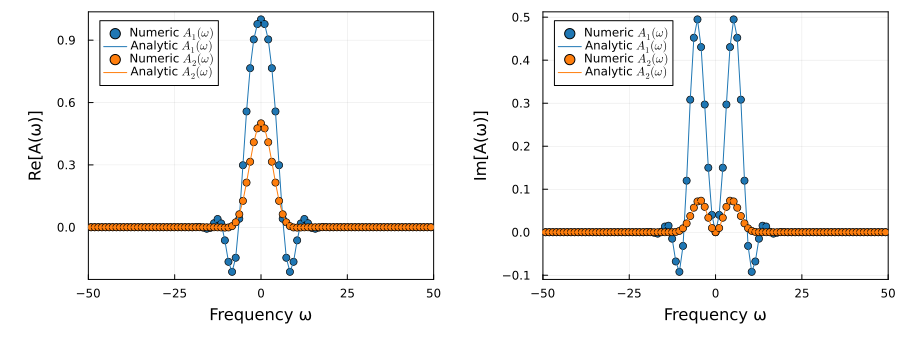

In [124]:
# Propagation in frequency domain
real_plt_ft = plot(frame=:box, xlimit=(-50,50));
imag_plt_ft = plot(frame=:box, xlimit=(-50,50));

plotCompare(arr_omega, amp_ft, analytic_pulse_ft, real_plt_ft, margins = 2Plots.mm, legend=:topleft, ylabel = "Re[A(ω)]",
    xtext = "Frequency", domain = "ω")
plotCompare(arr_omega, amp_ft, analytic_pulse_ft, imag_plt_ft; comp = imag, ylabel = "Im[A(ω)]",
    margins = 2Plots.mm, legend=:topleft, xtext = "Frequency", domain = "ω")

plot(real_plt_ft, imag_plt_ft, size=(900,350))

## Simulton in $\chi_{2}$ system
Test case if the dispersion term interacts correctly with the nonlinear term

In [125]:
# Simulton: k2"/k1" = 2
dopa1 = pars_nl()

# Modes in columns
dopa1.βnl = .- [0.0     0.0;  
                0.0     0.0;
                1.75e-3 3.5e-3];
dopa1.ωnl = [0.2 ; 0.4];
dopa1.κnl = 3.93e-2;

In [127]:
# Pulse properties
pulse_sml1 = pars_pulse()

# Specific for simulton
Amax = 1.2
T_sml1 = sqrt(6 * abs(dopa1.βnl[3,1]) / (dopa1.κnl * Amax))

pulse_sml1.amp_max = [Amax ; 0.5 * 1im * Amax];
pulse_sml1.T_pulse = [T_sml1 ; T_sml1];
pulse_sml1.N_div = (2^10);
pulse_sml1.f_pulse = Pulse.ff_sech;

# The pulsed DOPA properties
sml1 = nl_pulse(dopa1, pulse_sml1; fac = 10);

FFTW.set_num_threads(1)
p_fft1! = plan_fft!(sml1.init_amp, 1);
p_ifft1! = plan_ifft!(sml1.init_amp, 1);

In [128]:
# Split-step simulation for simulton
Lz = 83.2;
split_step_nl!(Lz, sml1, op_nl_dopa!, step_method = rk4_step_nl!, p_fft = (p_fft1!, p_ifft1!))

# Analytical result for simulton
anl_sml1 = Pulse.simulton_pulse_2(sml1.arr_time, Lz, Amax, dopa1.κnl, dopa1.βnl[3,1]);

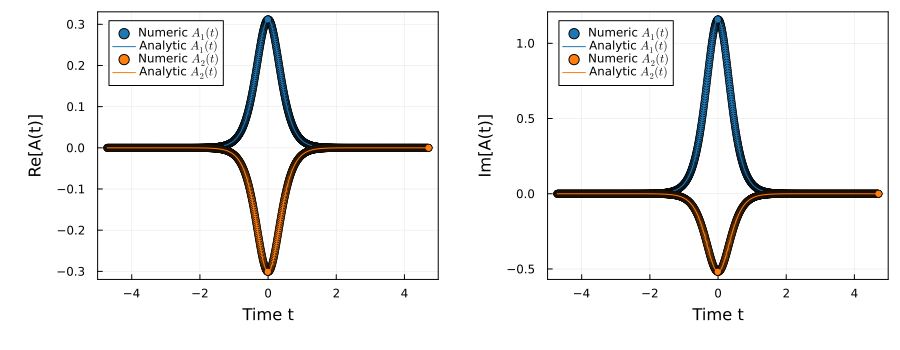

In [129]:
re_sml1_plt = plot(frame=:box); im_sml1_plt = plot(frame=:box)

plotCompare(sml1.arr_time, sml1.out_amp, anl_sml1, re_sml1_plt, margins = 2Plots.mm, legend=:topleft)
plotCompare(sml1.arr_time, sml1.out_amp, anl_sml1, im_sml1_plt; legend=:topleft, margins = 2Plots.mm,
    comp = imag, ylabel = "Im[A(t)]")

plot(re_sml1_plt, im_sml1_plt, size=(900,350))

## Benchmarking the split step method

In [130]:
# Simulton: k2"/k1" = 2
dopa1 = pars_nl()
dopa1.βnl = .- [0.0      0.0   ;
                0.0      0.0   ;
                1.75e-3  3.5e-3];
dopa1.ωnl = [0.2 ; 0.4];
dopa1.κnl = 3.93e-2;

# Pulse properties
pulse_sml1 = pars_pulse()

# Specific for simulton
Amax = 1.2
T_sml1 = sqrt(6 * abs(dopa1.βnl[3,1]) / (dopa1.κnl * Amax))

pulse_sml1.amp_max = [Amax ; 0.5 * 1im * Amax];
pulse_sml1.T_pulse = [T_sml1 ; T_sml1];
pulse_sml1.N_div = (2^10);
pulse_sml1.f_pulse = Pulse.ff_sech;

# The pulsed DOPA properties
sml1 = nl_pulse(dopa1, pulse_sml1; fac = 10);

FFTW.set_num_threads(1)
p_fft1! = plan_fft!(sml1.init_amp, 1);
p_ifft1! = plan_ifft!(sml1.init_amp, 1);

Benchmarking the duration & allocation, just for a single core

In [136]:
dz = 0.1
@btime split_step_nl!(dz, sml1, op_nl_dopa!, step_method = naive_step_nl!, p_fft = (p_fft1!, p_ifft1!))
@btime split_step_nl!(dz, sml1, op_nl_dopa!, step_method = rk4_step_nl!, p_fft = (p_fft1!, p_ifft1!))

  86.792 μs (65 allocations: 34.67 KiB)
  397.251 μs (308 allocations: 126.34 KiB)


In [137]:
Lz = 10
@btime split_step_nl!(Lz, sml1, op_nl_dopa!, step_method = naive_step_nl!, p_fft = (p_fft1!, p_ifft1!))
@btime split_step_nl!(Lz, sml1, op_nl_dopa!, step_method = rk4_step_nl!, p_fft = (p_fft1!, p_ifft1!))

  7.515 ms (5214 allocations: 245.89 KiB)
  41.817 ms (29513 allocations: 9.19 MiB)


In [134]:
@profile split_step_nl!(Lz, sml1, op_nl_dopa!, step_method = rk4_step_nl!)

In [135]:
Profile.print(format=:flat)

 Count  Overhead File                    Line Function
 =====  ======== ====                    ==== ========
     1         0 @Base/abstractarray.jl  1245 _getindex
     1         0 @Base/abstractarray.jl  2572 _sub2ind
     1         0 @Base/abstractarray.jl  2588 _sub2ind
     1         0 @Base/abstractarray.jl  2604 _sub2ind_recurse
     1         0 @Base/abstractarray.jl  1251 _to_linear_index
     1         0 @Base/abstractarray.jl  1218 getindex
     1         0 @Base/array.jl           353 fill!
     1         1 @Base/array.jl           903 setindex!
     1         0 @Base/array.jl           520 zeros(::Int64, ::Int64)
     1         0 @Base/array.jl           522 zeros
     1         0 @Base/array.jl           526 zeros
    24         2 @Base/boot.jl            373 eval
     1         0 @Base/broadcast.jl       636 _broadcast_getindex
     4         0 @Base/broadcast.jl       642 _broadcast_getindex
     4         0 @Base/broadcast.jl       643 _broadcast_getindex
     4      

### Tracking allocations line-by-line
Building block: naive_step

In [110]:
function naive_step_test!(dz, dpulse, op_nl; 
                        is_linear = false, p_fft = nothing, cache_id = 1, fft_dim = 1)
    @time temp = @view dpulse.temp_amp[:,:,cache_id]
    @time is_linear ? temp .= zeros(size(temp)...) : op_nl(dz, dpulse; cache_id = cache_id)
    @time dpulse.current_amp .= temp .+ dpulse.current_amp
    @time fw_disp!(dz, dpulse, p_fft = p_fft, fft_dim = fft_dim)
    return
end;

In [71]:
@time op_nl_dopa!(0.1, sml1; cache_id = 2)

  0.000120 seconds (32 allocations: 1.391 KiB)


In [115]:
naive_step_test!(0.2, sml1, op_nl_dopa!, is_linear = false, p_fft = (p_fft1!, p_ifft1!))

  0.000010 seconds (4 allocations: 144 bytes)
  0.000130 seconds (30 allocations: 1.375 KiB)
  0.000041 seconds (2 allocations: 128 bytes)
  0.000284 seconds (14 allocations: 448 bytes)


## Parallel code for split step

### Constructing a vector of objects

In [63]:
# Test case: Different simulton parametrizations
# Simulton: k2"/k1" = 2
dopa1 = pars_nl()
dopa1.βnl = .- [0.0      0.0;      
                0.0      0.0;
                1.75e-3  3.5e-3];
dopa1.ωnl = [0.2 ; 0.4];
dopa1.κnl = 3.93e-2;

In [64]:
len_pulse = 80;
id_thread = zeros(len_pulse)
sml_vec = Array{nl_pulse}(undef, len_pulse)

Abound = 6.0
dAmax = (Abound/len_pulse)
Amax_vec = collect(dAmax:dAmax:Abound)

# === Instantiate multiple objects ===
# In this case, we are just varying the pump/ signal amplitudes
for (i,Amax) in enumerate(Amax_vec)
    pulse_sml = pars_pulse()
    
    # Simulton width
    T_sml = sqrt(6 * abs(dopa1.βnl[3,1]) / (dopa1.κnl * Amax))

    pulse_sml.amp_max = [Amax ; 0.5 * 1im * Amax];
    pulse_sml.T_pulse = [T_sml; T_sml];
    pulse_sml.N_div = (2^10);
    pulse_sml.f_pulse = Pulse.ff_sech;

    sml_vec[i] = nl_pulse(dopa1, pulse_sml; fac = 10);
end

p_fft1! = plan_fft!(sml_vec[1].init_amp, 1);
p_ifft1! = plan_ifft!(sml_vec[1].init_amp, 1);

### Benchmarking FFTW behaviours

Benchmarking FFT behaviours for different nthreads <br>
<b> Resolved </b>: The gain is observed in the larger cases. Multithreading is implemented internally using FFTW library in C

In [ ]:
# It can be faster to simply use single threading for FFTW
Nthmax = 10;
t0vec = zeros(Nthmax)
tpvec = zeros(Nthmax)
for i in collect(1:Nthmax)
    FFTW.set_num_threads(i)
    # FFT
    t0vec[i] = @belapsed fft(sml1.init_amp[1,:])
    
    # Planned FFT
    p_fft1 = plan_fft(sml_vec[1].init_amp[1,:]);
    tpvec[i] = @belapsed p_fft1 * sml1.init_amp[1,:]
end

In [ ]:
plot(t0vec, xlabel = "Number of threads", ylabel = "Time (s)", frame=:box, label="FFTW")
plot!(tpvec, label = "Planned FFTW")

### Calculating multiple cases with multithreading

Check if we can have any gain from using multiple threads <br>
- Seems like we can get ~10x speed up with 40 threads

In [140]:
# Split-step: one instance only, 10 steps
Lz = 1.0;
FFTW.set_num_threads(1);
@btime split_step_nl!(0.1, sml_vec[3], op_nl_dopa!, dz=0.1, step_method = naive_step_nl!, p_fft = (p_fft1, p_ifft1))

  78.334 μs (65 allocations: 34.70 KiB)


In [141]:
@btime split_step_nl!(0.1, sml_vec[3], op_nl_dopa!, dz=0.1, step_method = rk4_step_nl!, p_fft = (p_fft1, p_ifft1))

  384.167 μs (311 allocations: 126.44 KiB)


In [142]:
@btime split_step_nl!(Lz, sml_vec[3], op_nl_dopa!, step_method = rk4_step_nl!, p_fft = (p_fft1, p_ifft1))

  3.866 ms (2963 allocations: 970.59 KiB)


In [143]:
# Using multi-threading
@btime Threads.@threads for i in collect(1:length(sml_vec))
    id_thread[i] = Threads.threadid()
    split_step_nl!(Lz, sml_vec[i], op_nl_dopa!, step_method = rk4_step_nl!, p_fft = (p_fft1, p_ifft1))
end

  20.326 ms (237243 allocations: 75.85 MiB)


In [144]:
# Simply for loops
@btime for i in collect(1:length(sml_vec))
    id_thread[i] = Threads.threadid()
    split_step_nl!(Lz, sml_vec[i], op_nl_dopa!, step_method = rk4_step_nl!, p_fft = (p_fft1, p_ifft1))
end

  350.420 ms (237122 allocations: 75.83 MiB)


In [146]:
sml_vec[1].arr_time

0.03686360311437002

### Trying CUDA
I definitely see a speed up using CUDA

In [72]:
# sml_vec is the list of dopa parameters
sml_cuda = nl_pulse_p(sml_vec);

In [74]:
size(sml_cuda.init_amp_p)

(1024, 80, 2)

In [8]:
L = 0.1
p_fft_cuda! = plan_fft!(sml_cuda.current_amp_p, 1)
p_ifft_cuda! = plan_ifft!(sml_cuda.current_amp_p, 1)
split_step_p!(L, sml_cuda, op_nl_dopa!, step_method = rk4_step_p!, p_fft = (p_fft_cuda!, p_ifft_cuda!))

In [68]:
# Using multi-threading
Lz = 10.0
@btime Threads.@threads for i in collect(1:length(sml_vec))
    id_thread[i] = Threads.threadid()
    split_step_nl!(Lz, sml_vec[i], op_nl_dopa!, step_method = rk4_step_nl!, p_fft = (p_fft1!, p_ifft1!))
end

  203.354 ms (2353248 allocations: 735.29 MiB)


In [69]:
@btime split_step_p!(Lz, sml_cuda, op_nl_dopa!, step_method = rk4_step_p!, p_fft = (p_fft_cuda!, p_ifft_cuda!))

  74.152 ms (230886 allocations: 16.38 MiB)


Now testing if the result is indeed accurate <br>
==> Yes, the GPU Code indeed works

In [55]:
Lz = 100.0
sml_cuda = nl_pulse_p(sml_vec);

In [58]:
Lz = 100.0
sml_cuda = nl_pulse_p(sml_vec);
split_step_p!(Lz, sml_cuda, op_nl_dopa!, step_method = rk4_step_p!, p_fft = (p_fft_cuda!, p_ifft_cuda!))
test_amp = Array(sml_cuda.out_amp_p);

In [32]:
Threads.@threads for i in collect(1:length(sml_vec))
    id_thread[i] = Threads.threadid()
    split_step_nl!(Lz, sml_vec[i], op_nl_dopa!, step_method = rk4_step_nl!, p_fft = (p_fft1!, p_ifft1!))
end

In [23]:
# Analytical bencmark
anl_sml_amp = zeros(ComplexF32, size(test_amp)...)
for i in 1:length(sml_vec)
    anl_sml_amp[:,i,:] .= Pulse.simulton_pulse_2(sml_vec[i].arr_time, Lz, Amax_vec[i], sml_vec[i].nl.κnl, sml_vec[i].nl.βnl[3,1]);
end

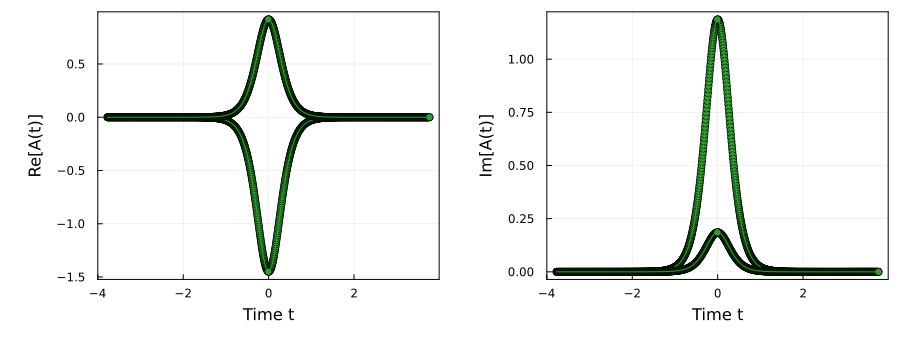

In [67]:
re_sml_plt = plot(frame=:box); im_sml_plt = plot(frame=:box)

# sml_vec[i_sml].out_amp or test_amp[:,i_sml,:]
i_sml = 25
color = palette(:tab20)[mod1(i_sml,20)]
plotCompare(sml_vec[i_sml].arr_time, test_amp[:,i_sml,:], anl_sml_amp[:,i_sml,:], re_sml_plt; 
    color = color, comp = real, margins = 2Plots.mm, legend=nothing, ylabel = "Re[A(t)]")
plotCompare(sml_vec[i_sml].arr_time, test_amp[:,i_sml,:], anl_sml_amp[:,i_sml,:], im_sml_plt; 
    legend=nothing, color = color, margins = 2Plots.mm,
    comp = imag, ylabel = "Im[A(t)]")

plot(re_sml_plt, im_sml_plt, size=(900,350))

# Electro-optic comb simulations

## Preparing the ECPO parameters in .json

In [3]:
# Basic ingredients: Pump, Signal and Idler wavelengths/ frequencies/ energies
ħ = 1.05457 * 1e-34

# PUMP, SIGNAL, IDLER
λp, λs = 1.05, 1.5 # μm
λi = round(λs * λp / (λs - λp), digits=5);

# In THz and J
ωp = 2*pi * (3*1e8)/λp * 1e6 * 1e-12; Ep = ħ * ωp * 1e12;
ωs = 2*pi * (3*1e8)/λs * 1e6 * 1e-12; Es = ħ * ωs * 1e12;
ωi = 2*pi * (3*1e8)/λi * 1e6 * 1e-12; Ei = ħ * ωi * 1e12;

P_signal = 0.1; P_pump = 20;
Np_signal = 1e6; Np_idler = 0; Np_pump = (P_pump * (40) * 1e-12 / Ep);

println("Amplitudes: ", [Np_signal; Np_idler; Np_pump])

Amplitudes: [1.0e6, 0.0, 4.22573978642771e9]


In [36]:
# Example how to set up the json file
test_1 = OrderedDict(
    # Pump and signal wavelength
    "lambda_p" => 1064., "lambda_s" => 1550.,
    
    # Waveguide
    "L_wg" => 2.5,
    
    # Cavity rounds
    "n_round" => 50, "n_saves" => 10, 
    "in_signal" => 0, "in_idler" => 0, "in_pump" => 1,
    "out_signal" => 0.1, "out_idler" => 0.1, "out_pump" => 0.1,
    "loss_signal" => 0.5, "loss_idler" => 1, "loss_pump" => 1, 
    "L_cav" => 1.5, 
    
    # Phase/ amplitude modulations
    "f_mod" => 25.0, "phase_mod_f" => "sin2", "amp_mod_f" => "sin2",
    "pm_depth" => 0.1, "pm_phase" => 0.0,
    "am_depth" => 1.0, "am_phase" => 0.0,
    
    # Dispersion + nonlinearity
    "csv_folder" => "./input/", "disp_csv" => "test_beta.csv", 
    "save_folder" => "./output/", "save_label" => "test",
    "omega_signal" => 0.0, "omega_idler" => 0.0, "omega_pump" => 0.0,
    "kappa" => 3.1e-3,
    
    # Pulse
    "N_div"  => (2^10),
    "signal_T" => 1/(25.0 * 10),"idler_T" => 1/(25.0 * 10), "pump_T" => 1/(25.0 * 10), 
    "signal_max" => sqrt(4.0e9), "idler_max" => 0.0, "pump_max" => sqrt(1e6), 
    "signal_func" => "rand", "idler_func" => "const", "pump_func" => "const")

test_string = JSON.json(test_1, 4)

# To write the json file
open("./input/template.json", "w") do f
    write(f, test_string)
end;

In [90]:
test_β = [0.0      0.0     0.0;
          0.0      0.0     0.0;
          1.75e-3  3.5e-3  4.0e-3];

In [91]:
test_β[:,2]

3-element Vector{Float64}:
 0.0
 0.0
 0.0035

In [113]:
CSV.write("./input/test_beta.csv", "r")

"./input/test_beta.csv"

### Trying progress bar

In [56]:
p = Progress(100, "ECPO cycle", 100)
for i in 1:100
    sleep(0.1)
    next!(p)
end

2mECPO cycle 100%|█████████████████████████████████████████| Time: 0:00:10

## Testing the ECPO/ ECPO Parallel class

### Simple trial

In [522]:
ecpo_try = ecpo("./input/template.json");

In [519]:
dpulse = ecpo_try.ecpo_pulse;
ecpo_fft! = plan_fft!(dpulse.init_amp, 1);
ecpo_ifft! = plan_ifft!(dpulse.init_amp, 1);

In [246]:
pulsed_ecpo_map(ecpo_try, op_nl_chi2!, p_fft = (ecpo_fft!, ecpo_ifft!))

ECPO cycle... 100%|██████████████████████████████████████| Time: 0:00:00


### Special class: Resonant-EO comb

In [6]:
using ResonantEO

In [38]:
# Generate some files
filedir, filename, npars = generate_input_files("master"; filedir = "./input/test_eo_cpu/");

#### Resonant-EO simulation

In [79]:
resonant_eo = ecpo("./input/test_eo_cpu/resonant_eo_5.json");
eo_save_dir = resonant_eo.save_folder
eo_save_label = resonant_eo.save_label

dpulse = resonant_eo.ecpo_pulse;
ecpo_fft! = plan_fft!(dpulse.init_amp, 1);
ecpo_ifft! = plan_ifft!(dpulse.init_amp, 1);

In [80]:
pulsed_ecpo_map(resonant_eo, op_nl_chi2!, p_fft = (ecpo_fft!, ecpo_ifft!))

ECPO cycle... 100%|██████████████████████████████████████| Time: 0:00:05


#### Resonant-EO theory

In [85]:
amp_theory = [Acav(t, resonant_eo) for t in sorted_time];
spec_theory = [AcavFT(k, resonant_eo) for k in arr_freq_bin];

#### Testing the ECPO Parallel Class

In [67]:
filedir, filename, npars = generate_input_files("master"; filedir = "./input/test_master/")

("./input/test_master/", "resonant_eo", 24)

In [54]:
# Make the ECPO Vector
ecpo_vec_test = Vector{ecpo}(undef,0)
for i in 1:npars
    push!(ecpo_vec_test, ecpo(filedir * filename * "_$(i).json"))
end

In [68]:
test_p = ecpo_p(ecpo_vec_test, filename);

In [69]:
p_fft_cuda! = plan_fft!(test_p.ecpo_pulse_p.current_amp_p, 1);
p_ifft_cuda! = plan_ifft!(test_p.ecpo_pulse_p.current_amp_p, 1);

In [70]:
pulsed_ecpo_map_p(test_p, op_nl_chi2!; dz = 0.1, step_method = rk4_step_p!,
        p_fft = (p_fft_cuda!, p_ifft_cuda!))

ECPO cycle... 100%|██████████████████████████████████████| Time: 0:00:02


### ECPO

In [629]:
# Generate some files
filedir, filename, npars = generate_input_files("master"; filedir = "./input/ecpo_cpu_lp1064/");

In [664]:
res_ecpo = ecpo("./input/ecpo_cpu_lp1064/ecpo_lp1064_248.json");
ecpo_save_dir = res_ecpo.save_folder
ecpo_save_label = res_ecpo.save_label

dpulse = res_ecpo.ecpo_pulse;
ecpo_fft! = plan_fft!(dpulse.init_amp, 1);
ecpo_ifft! = plan_ifft!(dpulse.init_amp, 1);

In [665]:
pulsed_ecpo_map(res_ecpo, op_nl_chi2!, dz = 0.1, p_fft = (ecpo_fft!, ecpo_ifft!))

ECPO cycle... 100%|██████████████████████████████████████| Time: 0:00:51


#### ECPO on GPU

In [680]:
filedir, filename, npars = generate_input_files("master"; filedir = "./input/ecpo_gpu_lp1064_b0/")

("./input/ecpo_gpu_lp1064_b0/", "ecpo_lp1064", 324)

In [681]:
# Make the ECPO Vector
ecpo_vec = Vector{ecpo}(undef,0)
for i in 1:npars
    push!(ecpo_vec, ecpo(filedir * filename * "_$(i).json"))
end

In [682]:
ecpo_output = ecpo_p(ecpo_vec, filename);

In [683]:
p_fft_cuda! = plan_fft!(ecpo_output.ecpo_pulse_p.current_amp_p, 1);
p_ifft_cuda! = plan_ifft!(ecpo_output.ecpo_pulse_p.current_amp_p, 1);

In [684]:
pulsed_ecpo_map_p(ecpo_output, op_nl_chi2!; dz = 0.1, step_method = rk4_step_p!,
        p_fft = (p_fft_cuda!, p_ifft_cuda!))

ECPO cycle... 100%|██████████████████████████████████████| Time: 0:04:34


## Plotting the resulting signals

### Resonant EO Comb

Plot: How the resonant-EO evolves in time

In [81]:
# Pulses at all time
t_sample = 100:100:2000
idx = 5
outdir = "./output/test_master/"
outlabel = "resonant_eo"
figdir = "./figures/test_master/"
figlabel = "resonant_eo_$(idx)"

raw_data = [load("$(outdir)$(outlabel)_t$i.jld")["amp"][:,idx,:] for i in t_sample]

final_amp = raw_data[end]
final_spectrum = fft(final_amp[:,1]);
offset_amp = 75
amp_abs = [abs.(raw_data[i]) .+ offset_amp * (length(raw_data)-i) for i in 1:length(raw_data)];

arr_time = resonant_eo.ecpo_pulse.arr_time;
sorted_time = sort(arr_time);
time_order = sortperm(arr_time);
pm_phase = [resonant_eo.phase_mod_func(t, resonant_eo.T_mod, 1, resonant_eo.pars_pm[2]) for t in sorted_time];

arr_freq = fftfreq(length(final_amp[:,1]));
arr_freq_bin = arr_freq ./ (arr_freq[2] - arr_freq[1]);
sorted_freq_bin = sort(arr_freq_bin);
freq_order = sortperm(arr_freq_bin);

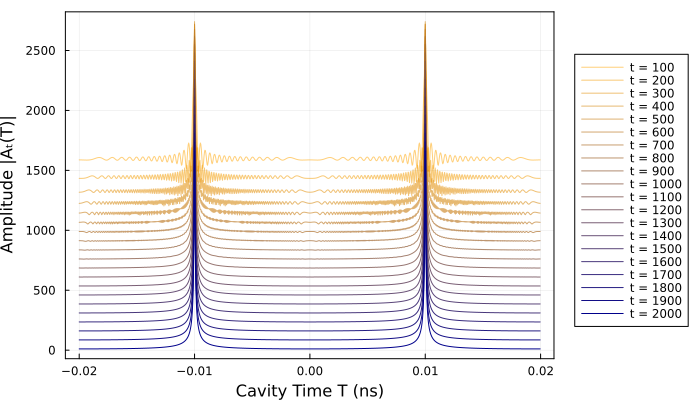

In [86]:
αst = 0.5

sorted_amp_abs = [amp_abs[i][time_order] for i in 1:length(amp_abs)]
pulse_evolve = plot(frame=:box, xlabel = "Cavity Time T (ns)", ylabel="Amplitude |Aₜ(T)|", 
    size=(700,400), legend=:outerright)
c_palette = palette(cgrad([:orange, :darkblue], [0.1, 0.3, 0.8]),length(raw_data))
for i in 1:length(raw_data)
    plot!(pulse_evolve, sorted_time, sorted_amp_abs[i], color=c_palette[i],
        alpha = αst + (1-αst) * i/length(raw_data), label = "t = $(t_sample[i])")
end
savefig(pulse_evolve, figdir * "pulse_evolve_" * outlabel * ".png")
pulse_evolve

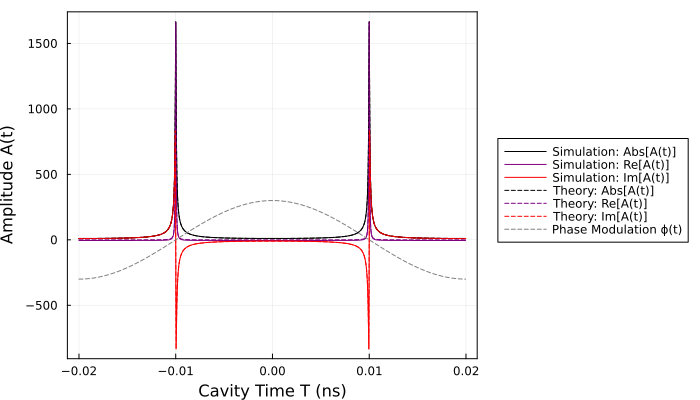

In [87]:
eq_amp = plot(frame=:box, xlabel = "Cavity Time T (ns)", ylabel="Amplitude A(t)", size=(700,400),
    legend=:outerright)
plot!(eq_amp, sorted_time, abs.(final_amp[:,1])[time_order], color=:black, label = "Simulation: Abs[A(t)]")
plot!(eq_amp, sorted_time, real.(final_amp[:,1])[time_order], color=:purple, label = "Simulation: Re[A(t)]")
plot!(eq_amp, sorted_time, imag.(final_amp[:,1])[time_order], color=:red, label = "Simulation: Im[A(t)]")

plot!(eq_amp, sorted_time, abs.(amp_theory), color=:black, linestyle=:dash, label = "Theory: Abs[A(t)]")
plot!(eq_amp, sorted_time, real.(amp_theory), color=:purple, linestyle=:dash, label = "Theory: Re[A(t)]")
plot!(eq_amp, sorted_time, imag.(amp_theory), color=:red, linestyle=:dash, label = "Theory: Im[A(t)]")

plot!(eq_amp, sorted_time, 3e2 .* pm_phase, color =:gray, linestyle=:dash, label = "Phase Modulation ϕ(t)")
savefig(eq_amp, figdir * "equilibrium_amp_" * outlabel * ".png")
eq_amp

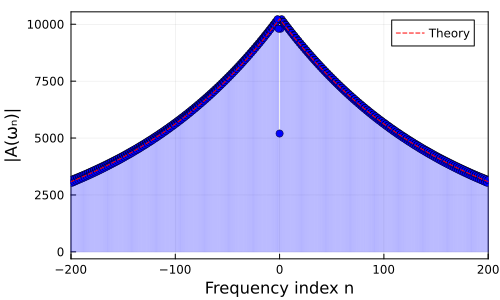

In [88]:
# Spectrum of the resonant EO comb
fid_max = 200
eq_spec = plot(frame=:box, xlabel = "Frequency index n", ylabel="|A(ωₙ)|", xlim = (-fid_max, fid_max), size=(500,300))
scatter!(eq_spec, arr_freq_bin, abs.(final_spectrum[:,1]), label = nothing, color=:blue)
sticks!(eq_spec, arr_freq_bin, abs.(final_spectrum[:,1]), label = nothing, color=:blue, alpha = 0.3)

plot!(eq_spec, sorted_freq_bin, length(arr_freq_bin) .* abs.(spec_theory)[freq_order], 
    color=:red, linestyle=:dash, label = "Theory")
savefig(eq_spec, figdir * "equilibrium_spectrum_" * outlabel * ".png")
eq_spec

### ECPO

#### Parametrizations

In [1752]:
function read_ecpo_pars(idx, folder, filename, pars_label)
    raw_json = JSON.parsefile("$(folder)$(filename)_$(idx).json");
    return [raw_json[pars] for pars in pars_label]
end
pars_label = ("pump_max", "loss_signal", "pm_depth", "am_depth");
pars_matrix = [read_ecpo_pars(idx, "./input/ecpo_gpu_lp1064/", "ecpo_lp1064", pars_label) for idx in 1:324]
pars_matrix = hcat(pars_matrix...)

4×324 Matrix{Float64}:
 0.0  1000.0  2000.0  3000.0  4000.0  …  5000.0  6000.0  7000.0  8000.0
 0.5     0.5     0.5     0.5     0.5        0.9     0.9     0.9     0.9
 1.5     1.5     1.5     1.5     1.5        6.0     6.0     6.0     6.0
 0.5     0.5     0.5     0.5     0.5        1.5     1.5     1.5     1.5

In [1753]:
(f_mod, N_div) = read_ecpo_pars(1, "./input/ecpo_gpu_lp1064/", "ecpo_lp1064", ["f_mod", "N_div"])
T_mod = 1/f_mod * 1e-12
# sorted_time = collect(-0.5 / f_mod: 1/(N_div * f_mod): 0.5 / f_mod - 1e-6)

5.0e-11

In [1754]:
color_10 = palette(:tab10)

In [1755]:
# Some ingredients
h = 6.626e-34
c0 = 3e8
λp = 1.064e-6; λs = 1.55e-6;
Ep = h * c0 / λp;
Es = h * c0 / λs;

In [1841]:
# How to extract relevant index
idxs = intersect!(
    findall(loss -> loss == 0.5, pars_matrix[2,:]), 
    findall(pm_depth -> pm_depth == 3.0, pars_matrix[3,:]), 
    findall(am_depth -> am_depth == 1.0, pars_matrix[4,:]))

9-element Vector{Int64}:
 136
 137
 138
 139
 140
 141
 142
 143
 144

#### Steady state under different parameters

In [1757]:
# Change the condition for the plots
var_id = 4; n_vars = 4;
(a_in, α, ϕpm, ϕam) = [6000., 0.5, 3.0, 1.5]

# Parameters
not_var_id = deleteat!(collect(1:4), var_id)
var_labels = ("Pᵢₙ", "α", "ϕₚₘ", "ϕₐₘ")
var_units = (" W", "", "", "")
pars = (a_in, α, ϕpm, ϕam) .^ (2,1,1,1) .* (Ep * 1e12, 1,1,1)

# Find the indices
cond1 = findall(pump -> pump == a_in, pars_matrix[1,:])
cond2 = findall(loss -> loss == α, pars_matrix[2,:])
cond3 = findall(pm_depth -> pm_depth == ϕpm, pars_matrix[3,:])
cond4 = findall(am_depth -> am_depth == ϕam, pars_matrix[4,:])
cond_list = deleteat!([cond1, cond2, cond3, cond4], var_id)

idxs = intersect!(cond_list...)
δidx = idxs[2]-idxs[1];

var_label = var_labels[var_id]
var_unit = var_units[var_id]
var_values = (abs.(pars_matrix[1,idxs]).^2 * Ep * 1e12,
    pars_matrix[2,idxs], pars_matrix[3,idxs], pars_matrix[4,idxs])[var_id];
var_title = join(["$(var_labels[id_var]) = $(round(pars[id_var], digits=2))$(var_units[id_var]); " for id_var in not_var_id]);

In [1758]:
obj = ecpo_vec[idx]
outdir = "./output/ecpo_gpu_lp1064/"

outlabel = "ecpo_lp$(lp)"
figdir = "./figures/ecpo_gpu_lp1064/"
figlabel_var = "ecpo_lp$(lp)_idxs$(idxs[begin])_$(δidx)_$(idxs[end])"

tfin = 1000
final_pulse = [load("$(outdir)$(outlabel)_t$(tfin).jld")["amp"][:,idx,:] for idx in idxs];
final_pulse_b0 = [load("$(outdir_b0)$(outlabel)_t$(tfin).jld")["amp"][:,idx,:] for idx in idxs];

pump_power = abs.(pars_matrix[1,idxs]).^2 * Es * 1e12;

In [1759]:
fft_test = plan_fft(final_pulse[1], 1);
Nd = size(final_pulse[1])[1]
final_pulse_fft = [(1/Nd) .* (fft_test * final_pulse[idx]) for idx in 1:length(final_pulse)];
final_pulse_Eft = [(2*pi*Es/T_mod) .* 1e3 .* abs.(final_pulse_fft[idx]) .^ 2 for idx in 1:length(final_pulse)];
final_pulse_fft_b0 = [(1/Nd) .* (fft_test * final_pulse_b0[idx]) for idx in 1:length(final_pulse_b0)];
final_pulse_Eft_b0 = [(2*pi*Es/T_mod) .* 1e3 .* abs.(final_pulse_fft_b0[idx]) .^ 2 for idx in 1:length(final_pulse_b0)];

In [1790]:
arr_freq = fftfreq(length(final_pulse[1][:,1]));
arr_freq_bin = arr_freq ./ (arr_freq[2] - arr_freq[1]);
# arr_real_freq = (.-arr_freq .* (length(arr_time)/ T_mod) .+ c0/(1.55e-6)) * 1e-12;
arr_real_freq =  .-arr_freq .* (length(arr_time)/ T_mod) .+ c0/(1.55e-6) * 1e-12;

sorted_freq_bin = sort(arr_freq_bin);
freq_order = sortperm(arr_freq_bin);
sorted_real_freq = arr_real_freq[freq_order];
sorted_real_lbd = (c0 ./ (sorted_real_freq .* 1e12)) .* 1e6;

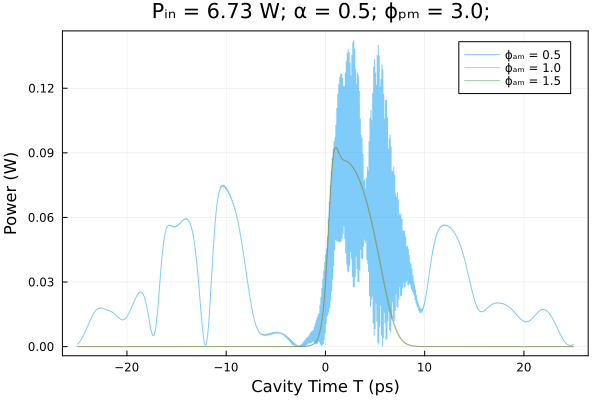

In [1761]:
final_pulse_plot = plot(frame=:box, xlabel = "Cavity Time T (ps)", ylabel = "Power (W)", title = var_title)
off = 0.0
for idp in 1:length(final_pulse)
    plot!(final_pulse_plot, sorted_time, (off * idp) .+ abs.(final_pulse[idp][time_order,1]).^2 * Es * 1e12,
        label = "$(var_label) = $(round(var_values[idp], digits=2)) $(var_unit)", alpha = 0.5)
end
savefig(final_pulse_plot, figdir * "pulse_var_" * figlabel_var * ".png")
final_pulse_plot

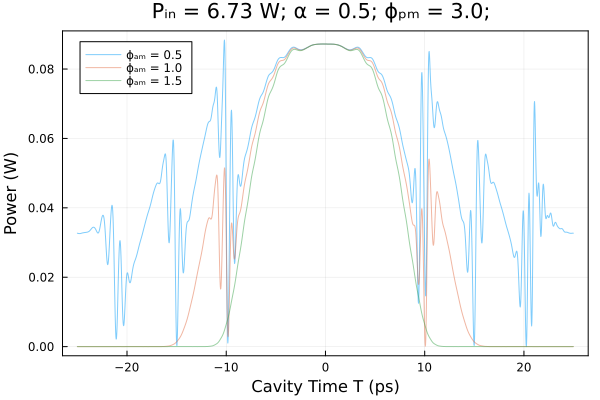

In [1762]:
final_pulse_plot_b0 = plot(frame=:box, xlabel = "Cavity Time T (ps)", ylabel = "Power (W)", title = var_title)
off = 0.0
for idp in 1:length(final_pulse)
    plot!(final_pulse_plot_b0, sorted_time, (off * idp) .+ abs.(final_pulse_b0[idp][time_order,1]).^2 * Es * 1e12,
        label = "$(var_label) = $(round(var_values[idp], digits=2)) $(var_unit)", alpha = 0.5)
end
savefig(final_pulse_plot_b0, figdir * "pulse_var_b0_" * figlabel_var * ".png")
final_pulse_plot_b0

In [1792]:
final_pulse_fft_plot = plot(frame=:box, xlabel = "Wavelength (μm)", ylabel = "Power (dBm)", title = var_title, 
    xlim = (1.52,1.58), ylim = (-20.5,0.5), legend=:outerright, size=(700,400))
off = 0.0

for idp in 1:length(final_pulse_Eft)
    bar!(final_pulse_fft_plot, sorted_real_lbd, log10.(final_pulse_Eft[idp][freq_order,1]),color=color_10[idp],
        label = nothing, alpha = 0.05, fillrange = -30, barwidth = 1e-5)
end

for idp in 1:length(final_pulse_Eft)
    plot!(final_pulse_fft_plot, sorted_real_lbd, log10.(final_pulse_Eft[idp][freq_order,1]),
        label = "$(var_label) = $(round(var_values[idp], digits=2)) $(var_unit)", color=color_10[idp])
end
savefig(final_pulse_fft_plot, figdir * "pulse_fft_var_" * figlabel_var * ".png")
final_pulse_fft_plot

In [1806]:
final_pulse_fft_plot_b0 = plot(frame=:box, xlabel = "Wavelength (μm)", ylabel = "Power (dBm)", title = var_title, 
    xlim = (1.52,1.58), ylim = (-20.5,0.5),legend=:outerright, size=(700,400))
off = 0.0
for idp in 1:length(final_pulse_Eft)
    bar!(final_pulse_fft_plot_b0, sorted_real_lbd, log10.(final_pulse_Eft_b0[idp][freq_order,1]),color=color_10[idp],
        label = nothing, alpha = 0.1, fillrange = -30)
end

for idp in 1:length(final_pulse_Eft)
    plot!(final_pulse_fft_plot_b0, sorted_real_lbd, log10.(final_pulse_Eft_b0[idp][freq_order,1]),color=color_10[idp],
        label = "$(var_label) = $(round(var_values[idp], digits=2)) $(var_unit)")
end
savefig(final_pulse_fft_plot_b0, figdir * "pulse_fft_var_b0_" * figlabel_var * ".png")
final_pulse_fft_plot_b0

#### Pulse evolution (time and frequency domain)

In [1968]:
# Pulses at all time
t_sample = 10:10:500
idx = 250
lp = 1064

"""
# FOR CPU
object = res_ecpo
outdir = "./output/ecpo_cpu_lp1064/"
outlabel = "ecpo_lp$(lp)_$(idx)"
figdir = "./figures/ecpo_cpu_lp1064/"
figlabel = "ecpo_lp$(lp)_$(idx)"
"""

# FOR GPU
obj = ecpo_vec[idx]
outdir = "./output/ecpo_gpu_lp1064/"
outdir_b0 = "./output/ecpo_gpu_lp1064_b0/"
outlabel = "ecpo_lp$(lp)"
figdir = "./figures/ecpo_gpu_lp1064/"
figlabel = "ecpo_lp$(lp)_$(idx)";

In [1969]:
# Define the time and frequency
arr_time = obj.ecpo_pulse.arr_time;
sorted_time = sort(arr_time);
time_order = sortperm(arr_time);
pm_phase = [res_ecpo.phase_mod_func(t, obj.T_mod, 1, obj.pars_pm[2]) for t in sorted_time];

T_mod = 2 * (maximum(arr_time) + (arr_time[2] - arr_time[1])) * 1e-12

arr_freq = fftfreq(length(final_amp[:,1]));
arr_freq_bin = arr_freq ./ (arr_freq[2] - arr_freq[1]);
arr_real_freq =  (.-arr_freq .* (length(arr_time)/ T_mod) .+ c0/(1.55e-6)) * 1e-12;

sorted_freq_bin = sort(arr_freq_bin);
freq_order = sortperm(arr_freq_bin);
sorted_real_freq = arr_real_freq[freq_order];
sorted_real_lbd = (c0 ./ (sorted_real_freq .* 1e12)) .* 1e6;

In [1970]:
# raw_data = [load("$(outdir)$(outlabel)_t$i.jld")["amp"] for i in t_sample]
raw_data = [load("$(outdir)$(outlabel)_t$i.jld")["amp"][:,idx,:] for i in t_sample]

# Labels
pars_labels = ("Pᵢₙ", "α", "ϕₚₘ", "ϕₐₘ")
pars_units = (" W", "", "", "")
pars_now = pars_matrix[:,idx] .^ (2,1,1,1) .* (Ep * 1e12, 1,1,1)
evolve_title = join(["$(pars_labels[id_var]) = $(round(pars_now[id_var], digits=2))$(var_units[id_var]); " 
        for id_var in 1:length(pars_labels)]);

final_amp = raw_data[end]
final_spectrum = fft(final_amp[:,1]);
offset_amp = 0.0;

In [1971]:
# Calculation in time domain
Nd = size(raw_data[begin])[1]
amp_abs = [abs.(raw_data[i]) .+ offset_amp * (length(raw_data)-i) for i in 1:length(raw_data)];
amp_real = [real.(raw_data[i]) for i in 1:length(raw_data)];
amp_imag = [imag.(raw_data[i]) for i in 1:length(raw_data)];

# Modulation
(key_f, freq_mod, pm_d, pm_p) = read_ecpo_pars(idx, "./input/ecpo_gpu_lp1064/", 
    "ecpo_lp1064", ["phase_mod_f", "f_mod", "pm_depth", "pm_phase"]);
arr_pm = exp.(1im.*[modulation_func[key_f](t, 1/freq_mod, pm_d, pm_p) for t in arr_time])
sorted_pm = arr_pm[time_order]

# Sorted amplitude
sorted_amp_abs = [amp_abs[i][time_order] for i in 1:length(amp_abs)];
sorted_amp_real = [amp_real[i][time_order] for i in 1:length(amp_real)];
sorted_amp_imag = [amp_imag[i][time_order] for i in 1:length(amp_imag)];
sorted_phase_nl = [angle.(amp_real[i][time_order] + 1im .* amp_imag[i][time_order]) 
    for i in 1:length(amp_real)];
sorted_phase_tot = [angle.((amp_real[i][time_order] + 1im .* amp_imag[i][time_order]) .* 
    arr_pm[time_order]) for i in 1:length(amp_real)];

In [1972]:
# Calculation in frequency domain
sorted_fft = [(1/Nd) .* fft(raw_data[i][:,1])[freq_order] for i in 1:length(raw_data)];
sorted_fft_real = [real.(sorted_fft[i]) for i in 1:length(sorted_fft)];
sorted_fft_imag = [imag.(sorted_fft[i]) for i in 1:length(sorted_fft)];
sorted_fft_abs = [abs.(sorted_fft[i]) for i in 1:length(sorted_fft)];
sorted_Eft = [(2*pi*Es/T_mod) .* 1e3 .* sorted_fft_abs[i].^2 for i in 1:length(sorted_fft)];
sorted_fft_phase = [angle.(sorted_fft[i]) for i in 1:length(sorted_fft)];

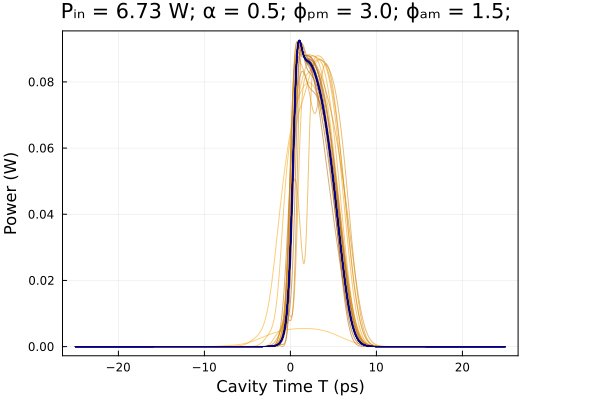

In [1973]:
αst = 0.5

pulse_evolve = plot(frame=:box, xlabel = "Cavity Time T (ps)", ylabel="Power (W)", 
    size=(600,400), legend=:outerright, title=evolve_title)
c_palette = palette(cgrad([:orange, :darkblue], [0.1, 0.3, 0.8]),length(raw_data))
for i in 1:length(raw_data)
    plot!(pulse_evolve, sorted_time, sorted_amp_abs[i] .^2 * Es * 1e12, color=c_palette[i],
        alpha = αst + (1-αst) * i/length(raw_data), label = nothing)
end
savefig(pulse_evolve, figdir * "pulse_evolve_" * figlabel * ".png")
pulse_evolve

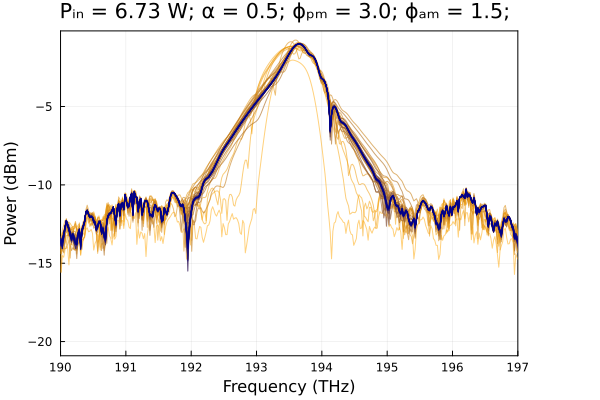

In [1858]:
αst = 0.5
f_window = (190,197)

pulse_fft_evolve = plot(frame=:box, xlabel = "Frequency (THz)", ylabel="Power (dBm)", 
    size=(600,400), legend=:outerright, title=evolve_title, xlim = f_window)
c_palette = palette(cgrad([:orange, :darkblue], [0.1, 0.3, 0.8]),length(raw_data))
for i in 1:length(raw_data)
    plot!(pulse_fft_evolve, sorted_real_freq, log10.(sorted_Eft[i]), color=c_palette[i],
        alpha = αst + (1-αst) * i/length(raw_data), label = nothing)
end
# savefig(pulse_evolve, figdir * "pulse_fft_evolve_" * figlabel * ".png")
pulse_fft_evolve

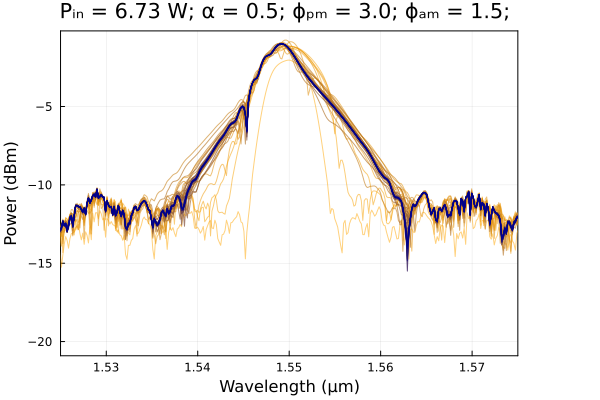

In [1859]:
αst = 0.5
l_window = (1.525,1.575)

pulse_lbd_evolve = plot(frame=:box, xlabel = "Wavelength (μm)", ylabel="Power (dBm)", 
    size=(600,400), legend=:outerright, title=evolve_title, xlim = l_window)
c_palette = palette(cgrad([:orange, :darkblue], [0.1, 0.3, 0.8]),length(raw_data))
for i in 1:length(raw_data)
    plot!(pulse_lbd_evolve, sorted_real_lbd, log10.(sorted_Eft[i]), color=c_palette[i],
        alpha = αst + (1-αst) * i/length(raw_data), label = nothing)
end
# savefig(pulse_evolve, figdir * "pulse_fft_evolve_" * figlabel * ".png")
pulse_lbd_evolve

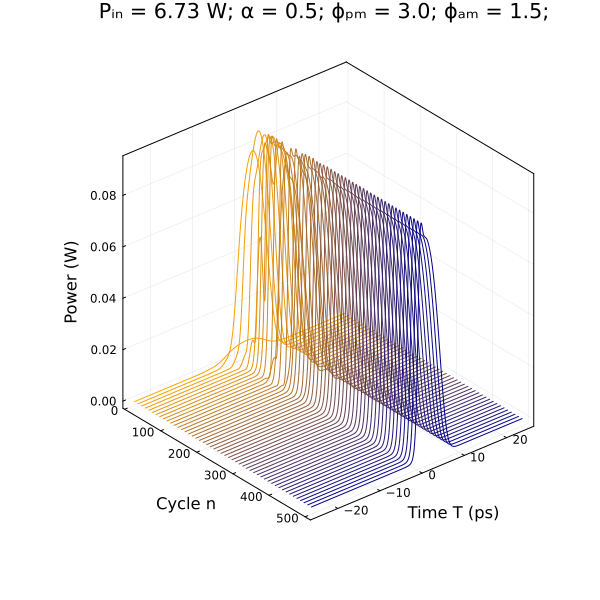

In [1860]:
# Plotting the pulse development over time
time_matrix = repeat(collect(t_sample), 1, length(arr_time))

pulse_evolve_3d = plot3d(size=(600,600,600), frame=:box,
    title = evolve_title,
    xlabel = "Cycle n", 
    ylabel = "Time T (ps)", 
    zlabel = "Power (W)")

for i in 1:size(sorted_amp_abs)[1]
    plot3d!(pulse_evolve_3d, time_matrix[i,:], sorted_time, sorted_amp_abs[i] .^2 .*(Es * 1e12), 
        color=c_palette[i], label=nothing, camera = (50,30))
end
savefig(pulse_evolve_3d, figdir * "pulse_evolve_3d_" * figlabel * ".png")
pulse_evolve_3d

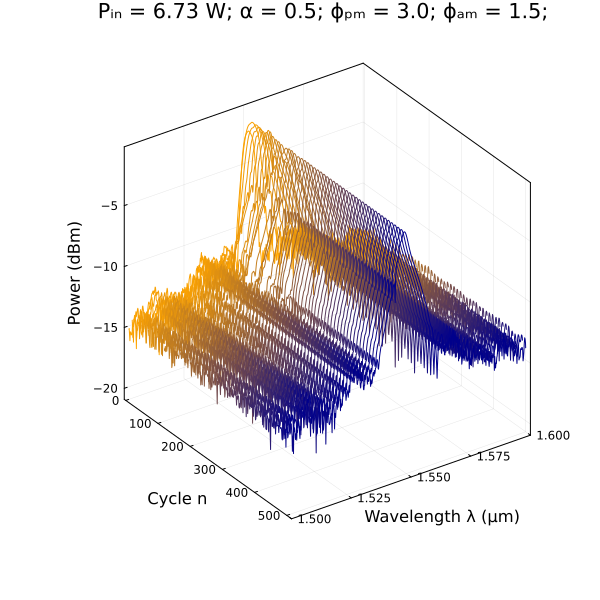

In [1861]:
# Plotting the pulse development over time
time_matrix = repeat(collect(t_sample), 1, length(arr_time))

pulse_evolve_lbd_3d = plot3d(size=(600,600,600), frame=:box,
    title = evolve_title,
    ylim = (1.5,1.6),
    xlabel = "Cycle n", 
    ylabel = "Wavelength λ (μm)", 
    zlabel = "Power (dBm)")

for i in 1:size(sorted_amp_abs)[1]
    plot3d!(pulse_evolve_lbd_3d, time_matrix[i,:], sorted_real_lbd, log10.(sorted_Eft[i]), 
        color=c_palette[i], label=nothing, camera = (55,30))
end
savefig(pulse_evolve_lbd_3d, figdir * "pulse_evolve_lbd_3d_" * figlabel * ".png")
pulse_evolve_lbd_3d

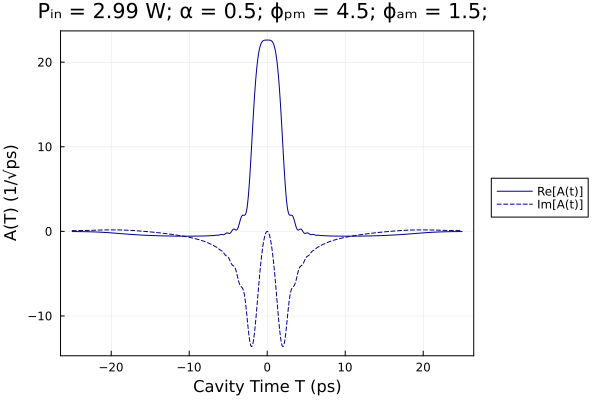

In [1443]:
plot_amp_full = plot(frame=:box, xlabel = "Cavity Time T (ps)", ylabel="A(T) (1/√ps)", 
    size=(600,400), legend=:outerright, title=evolve_title)

plot!(plot_amp_full, sorted_time, sorted_amp_real[end][:,1], color=:darkblue, label="Re[A(t)]")
plot!(plot_amp_full, sorted_time, sorted_amp_imag[end][:,1], color=:darkblue, linestyle=:dash, label="Im[A(t)]")

savefig(plot_phase, figdir * "plot_amp_full_" * figlabel * ".png")
plot_amp_full

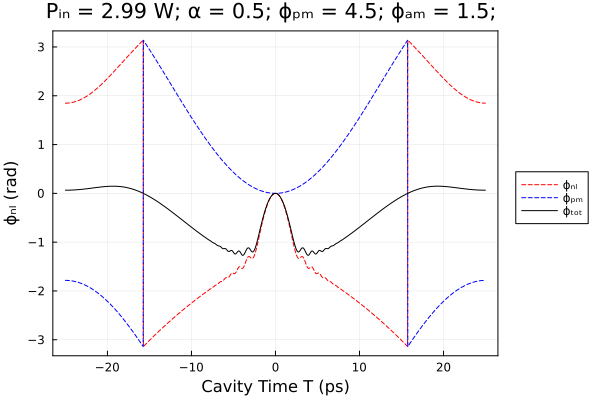

In [1444]:
plot_phase = plot(frame=:box, xlabel = "Cavity Time T (ps)", ylabel="ϕₙₗ (rad)", 
    size=(600,400), legend=:outerright, title=evolve_title)

plot!(plot_phase, sorted_time, sorted_phase_nl[end][:,1], color=:red, label="ϕₙₗ", linestyle=:dash)
plot!(plot_phase, sorted_time, angle.(sorted_pm), color=:blue, label="ϕₚₘ", linestyle=:dash)
plot!(plot_phase, sorted_time, sorted_phase_tot[end][:,1], color=:black,label="ϕₜₒₜ")

savefig(plot_phase, figdir * "pulse_phase_" * figlabel * ".png")
plot_phase

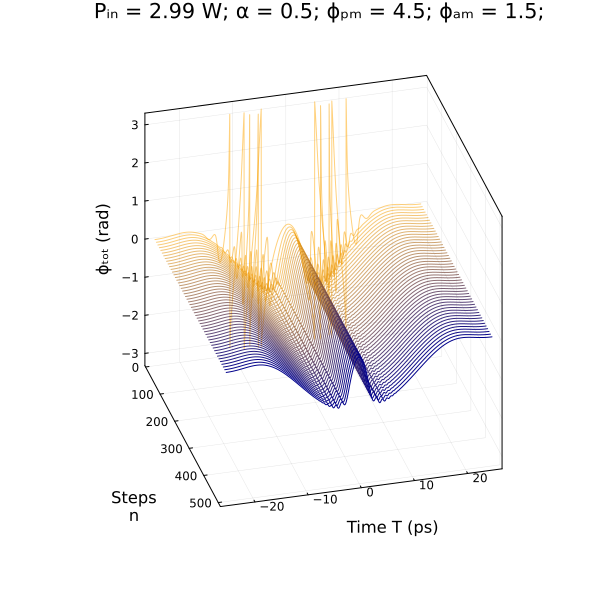

In [1445]:
plot_phase_evolve = plot3d(frame=:box, 
    xlabel = "Steps\nn", 
    ylabel = "Time T (ps)", 
    zlabel="ϕₜₒₜ (rad)", 
    size=(600,600), title=evolve_title, 
    xguidefontrotation = 70,
    camera = (75,30))

for i in 1:length(sorted_phase)
    plot3d!(plot_phase_evolve, time_matrix[i,:], sorted_time, sorted_phase_tot[i][:,1], color=c_palette[i],
        alpha = αst + (1-αst) * i/length(sorted_phase_tot), label=nothing)
end

savefig(plot_phase_evolve, figdir * "phase_evolve_" * figlabel * ".png")
plot_phase_evolve

#### Fourier transform

#### The spectrogram

In [1864]:
using Interpolations

In [1974]:
# Pulses at all time
t_sample = 10:10:500
idx = 142
lp = 1064

# FOR GPU
obj = ecpo_vec[idx]
outdir = "./output/ecpo_gpu_lp1064/"
outdir_b0 = "./output/ecpo_gpu_lp1064_b0/"
outlabel = "ecpo_lp$(lp)"
figdir = "./figures/ecpo_gpu_lp1064/"
figlabel = "ecpo_lp$(lp)_$(idx)";

raw_data = [load("$(outdir)$(outlabel)_t$i.jld")["amp"][:,idx,:] for i in t_sample];

In [1975]:
m_sample = 2^8; # The original one
n_sample = 2^8; # The interpolated one
T_mod = (2 * (maximum(arr_time) + (arr_time[2] - arr_time[1]))) * 1e-12
T_spec = m_sample/length(arr_time) * T_mod

disc_signal = raw_data[end][time_order,1]
disc_signal = vcat(disc_signal[end-Int(m_sample/2)+1:end], disc_signal, disc_signal[1:Int(m_sample/2)])
spec_matrix = zeros(ComplexF32, n_sample, length(arr_time))
t_points = collect(1:m_sample/n_sample:m_sample+1-1/n_sample);
for j in 1:length(arr_time)
    itp = interpolate(disc_signal[j:m_sample+j], BSpline(Quadratic()));
    spec_matrix[:,j] = [itp(t) for t in t_points];
end

fft_spec = plan_fft!(spec_matrix, 1)
ifft_spec = plan_ifft!(spec_matrix, 1)
spec_freq_matrix = fft_spec * spec_matrix;

# Frequency
spec_freq = (.-fftfreq(size(spec_matrix)[1]) .* (n_sample / T_spec) .+ c0/(1.55e-6) ) * 1e-12;
freq_order = sortperm(spec_freq);
sorted_freq = sort(spec_freq);

# Lambda
spec_lbd = (c0 ./ (spec_freq .* 1e12)) .* 1e6;
lbd_order = sortperm(spec_lbd);
sorted_lbd = spec_lbd[lbd_order];
# raw_data[end][:,1];

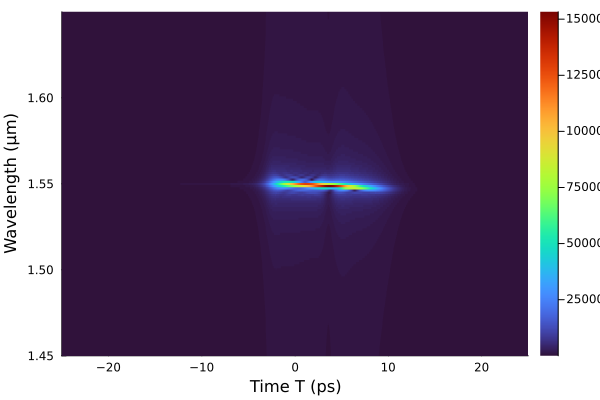

In [1976]:
mat_X = repeat(spec_freq,1,length(arr_time))
mat_Y = transpose(repeat(sorted_time, 1, m_sample))
heatmap(sorted_time, sorted_lbd, abs.(spec_freq_matrix[lbd_order,:]),
    xlabel = "Time T (ps)", ylabel = "Wavelength (μm)", ylim = (1.45, 1.65),
    levels=30, color=:turbo)

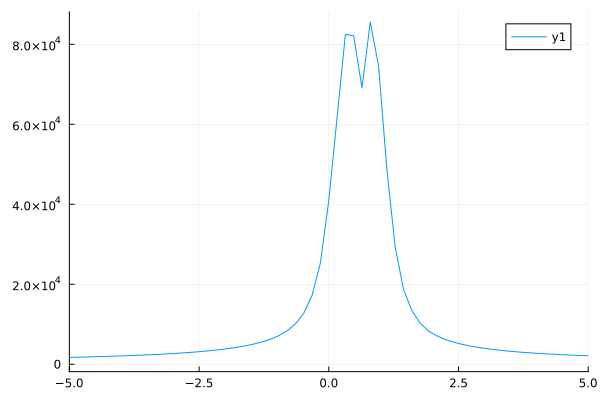

In [1929]:
plot(spec_freq, abs.(spec_freq_matrix[freq_order,900]), xlim = (-5,5))